In [1]:
#import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



DATA UNDERSTANDING

In [2]:
#loading dataset
data = pd.read_csv('/content/tn.movie_budgets.csv.gz')

In [4]:
data

,id,release_date,movie,production_budget,domestic_gross,worldwide_gross
0,1,"Dec 18, 2009",Avatar,"$425,000,000","$760,507,625","$2,776,345,279"
1,2,"May 20, 2011",Pirates of the Caribbean: On Stranger Tides,"$410,600,000","$241,063,875","$1,045,663,875"
2,3,"Jun 7, 2019",Dark Phoenix,"$350,000,000","$42,762,350","$149,762,350"
3,4,"May 1, 2015",Avengers: Age of Ultron,"$330,600,000","$459,005,868","$1,403,013,963"
4,5,"Dec 15, 2017",Star Wars Ep. VIII: The Last Jedi,"$317,000,000","$620,181,382","$1,316,721,747"
...,...,...,...,...,...,...
5777,78,"Dec 31, 2018",Red 11,"$7,000",$0,$0
5778,79,"Apr 2, 1999",Following,"$6,000","$48,482","$240,495"
5779,80,"Jul 13, 2005",Return to the Land of Wonders,"$5,000","$1,338","$1,338"
5780,81,"Sep 29, 2015",A Plague So Pleasant,"$1,400",$0,$0


In [5]:
data.head()

,id,release_date,movie,production_budget,domestic_gross,worldwide_gross
0,1,"Dec 18, 2009",Avatar,"$425,000,000","$760,507,625","$2,776,345,279"
1,2,"May 20, 2011",Pirates of the Caribbean: On Stranger Tides,"$410,600,000","$241,063,875","$1,045,663,875"
2,3,"Jun 7, 2019",Dark Phoenix,"$350,000,000","$42,762,350","$149,762,350"
3,4,"May 1, 2015",Avengers: Age of Ultron,"$330,600,000","$459,005,868","$1,403,013,963"
4,5,"Dec 15, 2017",Star Wars Ep. VIII: The Last Jedi,"$317,000,000","$620,181,382","$1,316,721,747"


In [6]:
data.shape

(5782, 6)

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5782 entries, 0 to 5781
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   id                 5782 non-null   int64 
 1   release_date       5782 non-null   object
 2   movie              5782 non-null   object
 3   production_budget  5782 non-null   object
 4   domestic_gross     5782 non-null   object
 5   worldwide_gross    5782 non-null   object
dtypes: int64(1), object(5)
memory usage: 271.2+ KB


In [8]:
#checking duplicates
data.duplicated().sum()

0

In [9]:
#Checking missing values
data.isna().sum()

,0
id,0
release_date,0
movie,0
production_budget,0
domestic_gross,0
worldwide_gross,0


In [10]:
data.describe()

,id
count,5782.000000
mean,50.372363
std,28.821076
min,1.000000
25%,25.000000
50%,50.000000
75%,75.000000
max,100.000000


In [11]:
#connecting the data to sql
import sqlite3


In [12]:
conn = sqlite3.connect('data')
cursor = conn.cursor()

In [13]:
cursor.execute('''
CREATE TABLE IF NOT EXISTS movies (
    id INTEGER PRIMARY KEY,
    release_date TEXT,
    movie TEXT,
    production_budget INTEGER,
    domestic_gross INTEGER,
    worldwide_gross INTEGER
)
''')

In [14]:
cursor.execute('''
INSERT INTO movies (id, release_date, movie, production_budget, domestic_gross, worldwide_gross)
VALUES
(1, 'Dec 18, 2009', 'Avatar', 425000000, 760507625, 2776345279),
(2, 'May 20, 2011', 'Pirates of the Caribbean: On Stranger Tides', 410600000, 241063875, 1045663875),
(3, 'Jun 7, 2019', 'Dark Phoenix', 350000000, 42762350, 149762350),
(4, 'May 1, 2015', 'Avengers: Age of Ultron', 330600000, 459005868, 1403013963),
(5, 'Dec 15, 2017', 'Star Wars Ep. VIII: The Last Jedi', 317000000, 620181382, 1316721747)
''')

In [15]:
conn.commit()

In [16]:

cursor.execute('SELECT * FROM movies')
rows = cursor.fetchall()
for row in rows:
    print(row)


(1, 'Dec 18, 2009', 'Avatar', 425000000, 760507625, 2776345279)
(2, 'May 20, 2011', 'Pirates of the Caribbean: On Stranger Tides', 410600000, 241063875, 1045663875)
(3, 'Jun 7, 2019', 'Dark Phoenix', 350000000, 42762350, 149762350)
(4, 'May 1, 2015', 'Avengers: Age of Ultron', 330600000, 459005868, 1403013963)
(5, 'Dec 15, 2017', 'Star Wars Ep. VIII: The Last Jedi', 317000000, 620181382, 1316721747)


In [17]:
conn.close()


In [18]:
#Find Movies with the Highest ROI (Return on Investment)
#the purpose of Calculating the ROI (worldwide gross / production budget) for each movie to identify the most profitable movies
import sqlite3


In [19]:
conn = sqlite3.connect('data')
cursor = conn.cursor()

In [20]:
cursor.execute('''
SELECT
    movie,
    production_budget,
    worldwide_gross,
    (worldwide_gross / production_budget) AS roi
FROM movies
ORDER BY roi DESC;
''')

In [21]:
rows = cursor.fetchall()
for row in rows:
    print(row)

('Avatar', 425000000, 2776345279, 6)
('Avengers: Age of Ultron', 330600000, 1403013963, 4)
('Star Wars Ep. VIII: The Last Jedi', 317000000, 1316721747, 4)
('Pirates of the Caribbean: On Stranger Tides', 410600000, 1045663875, 2)
('Dark Phoenix', 350000000, 149762350, 0)


In [22]:
conn.close()

In [23]:
#a barplot visualization using the roi findings to display the most profitable movie
movies = [row[0] for row in rows]
roi_values = [row[3] for row in rows]

<ipython-input-24-9b9daf142690>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=movies, y=roi_values, palette="viridis")


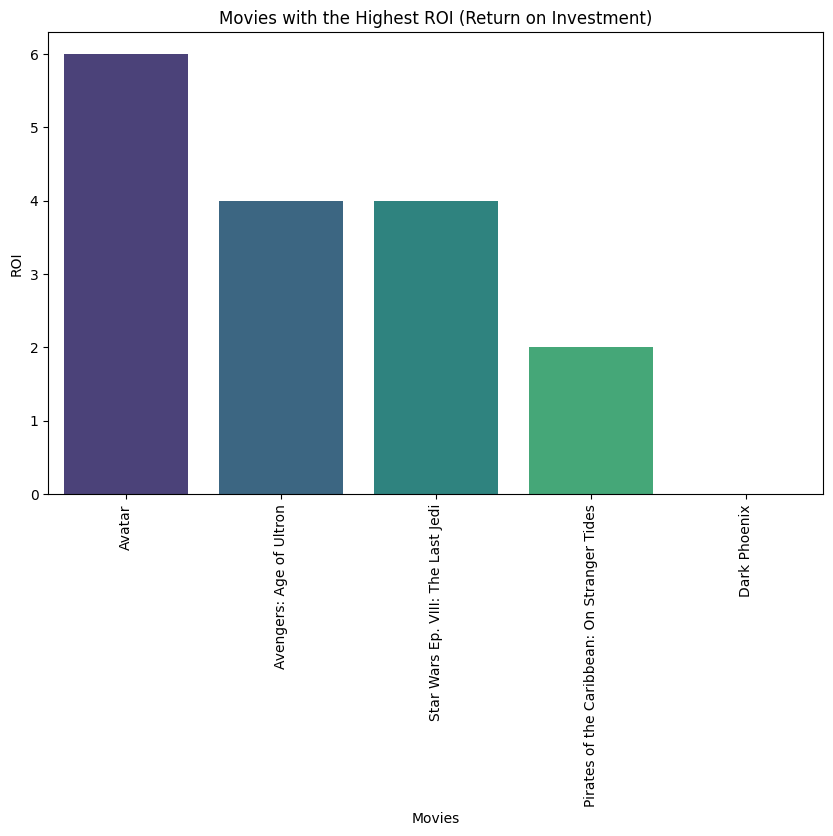

In [24]:
plt.figure(figsize=(10, 6))
sns.barplot(x=movies, y=roi_values, palette="viridis")
plt.xlabel('Movies')
plt.ylabel('ROI')
plt.title('Movies with the Highest ROI (Return on Investment)')
plt.xticks(rotation=90)
plt.show()

In [25]:
#performing an sql querry to identify Low-Budget Movies That Performed Well.
#this is so as to identify movies that have provided a high return on investment despite low production budgets, which could influence the studio’s strategy.
import sqlite3

In [26]:
conn = sqlite3.connect(':memory:')

In [27]:
data.to_sql('movies', conn, index=False, if_exists='replace')


5782

In [28]:
conn.commit()

In [29]:
query = """
SELECT movie, production_budget, domestic_gross, worldwide_gross,
       (worldwide_gross / production_budget) AS roi
FROM movies
WHERE production_budget < 100000000
ORDER BY roi DESC;
"""

In [30]:
result = pd.read_sql_query(query, conn)

In [31]:
result

,movie,production_budget,domestic_gross,worldwide_gross,roi
0,Avatar,"$425,000,000","$760,507,625","$2,776,345,279",None
1,Pirates of the Caribbean: On Stranger Tides,"$410,600,000","$241,063,875","$1,045,663,875",None
2,Dark Phoenix,"$350,000,000","$42,762,350","$149,762,350",None
3,Avengers: Age of Ultron,"$330,600,000","$459,005,868","$1,403,013,963",None
4,Star Wars Ep. VIII: The Last Jedi,"$317,000,000","$620,181,382","$1,316,721,747",None
...,...,...,...,...,...
5777,Red 11,"$7,000",$0,$0,None
5778,Following,"$6,000","$48,482","$240,495",None
5779,Return to the Land of Wonders,"$5,000","$1,338","$1,338",None
5780,A Plague So Pleasant,"$1,400",$0,$0,None


In [32]:
conn.close()

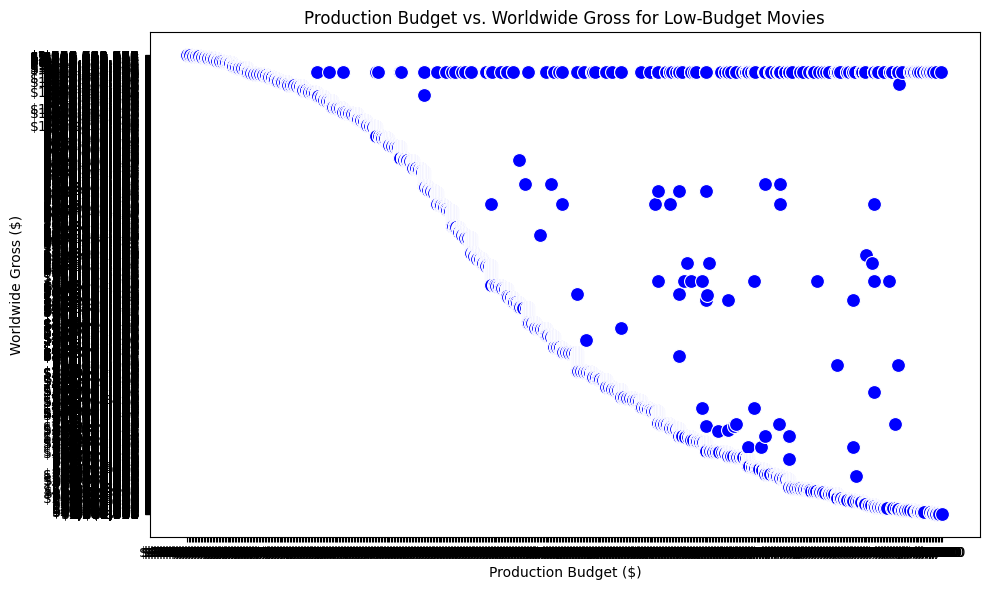

In [33]:

plt.figure(figsize=(10, 6))
sns.scatterplot(x='production_budget', y='worldwide_gross', data=result, color='blue', s=100)
plt.title('Production Budget vs. Worldwide Gross for Low-Budget Movies')
plt.xlabel('Production Budget ($)')
plt.ylabel('Worldwide Gross ($)')
plt.tight_layout()
plt.show()

In [34]:
#using WHERE clause so as filter out extreme outliers in your data (ie, movies that underperformed despite high budgets).

import sqlite3

In [35]:
# Create a pandas DataFrame
df = pd.DataFrame(data)

In [36]:
# Clean the data (remove dollar signs and commas, then convert to numeric)
df['production_budget'] = df['production_budget'].replace({'\$': '', ',': ''}, regex=True).astype(float)
df['domestic_gross'] = df['domestic_gross'].replace({'\$': '', ',': ''}, regex=True).astype(float)
df['worldwide_gross'] = df['worldwide_gross'].replace({'\$': '', ',': ''}, regex=True).astype(float)


In [37]:
# Connect to an in-memory SQLite database
conn = sqlite3.connect(':memory:')

In [38]:
# Load the DataFrame into SQLite
df.to_sql('movies', conn, index=False, if_exists='replace')

5782

In [43]:
# SQL query to find movies with an ROI greater than 3 (using WHERE clause)
query = """
SELECT movie, production_budget, worldwide_gross,
       (worldwide_gross / production_budget) AS roi
FROM movies
WHERE (worldwide_gross / production_budget) > 3;
"""

In [44]:
result = pd.read_sql_query(query, conn)

In [45]:
result

,movie,production_budget,worldwide_gross,roi
0,Avatar,425000000.0,2.776345e+09,6.532577
1,Avengers: Age of Ultron,330600000.0,1.403014e+09,4.243841
2,Star Wars Ep. VIII: The Last Jedi,317000000.0,1.316722e+09,4.153696
3,Star Wars Ep. VII: The Force Awakens,306000000.0,2.053311e+09,6.710167
4,Avengers: Infinity War,300000000.0,2.048134e+09,6.827114
...,...,...,...,...
1850,El Mariachi,7000.0,2.041928e+06,291.704000
1851,Primer,7000.0,8.419260e+05,120.275143
1852,Cavite,7000.0,7.164400e+04,10.234857
1853,Following,6000.0,2.404950e+05,40.082500


Scatter Plot of Production Budget vs. Worldwide Gross

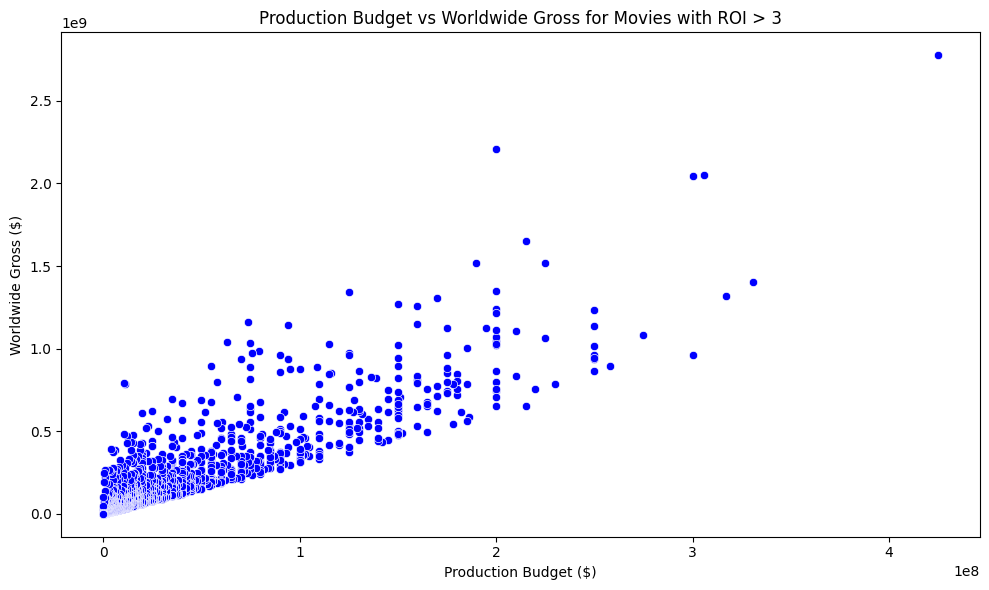

In [46]:
#This plot helps to visualize the relationship between the production budget and worldwide gross for high-performing movies (with ROI > 3)
#It can show if there's a clear correlation between budget size and success.
plt.figure(figsize=(10, 6))
sns.scatterplot(x='production_budget', y='worldwide_gross', data=result, color='blue')
plt.title('Production Budget vs Worldwide Gross for Movies with ROI > 3')
plt.xlabel('Production Budget ($)')
plt.ylabel('Worldwide Gross ($)')
plt.tight_layout()
plt.show()


In [47]:
#performing the SQL query that compares domestic gross vs worldwide gross
import sqlite3

In [48]:
df = pd.DataFrame(data)

In [49]:
# Clean the data (remove dollar signs and commas, then convert to numeric)
df['production_budget'] = df['production_budget'].replace({'\$': '', ',': ''}, regex=True).astype(float)
df['domestic_gross'] = df['domestic_gross'].replace({'\$': '', ',': ''}, regex=True).astype(float)
df['worldwide_gross'] = df['worldwide_gross'].replace({'\$': '', ',': ''}, regex=True).astype(float)


In [50]:
conn = sqlite3.connect(':memory:')

In [51]:
df.to_sql('movies', conn, index=False, if_exists='replace')

5782

In [52]:
query = """
SELECT movie, domestic_gross, worldwide_gross
FROM movies
ORDER BY worldwide_gross DESC;
"""

In [53]:
result = pd.read_sql_query(query, conn)
result

,movie,domestic_gross,worldwide_gross
0,Avatar,760507625.0,2.776345e+09
1,Titanic,659363944.0,2.208208e+09
2,Star Wars Ep. VII: The Force Awakens,936662225.0,2.053311e+09
3,Avengers: Infinity War,678815482.0,2.048134e+09
4,Jurassic World,652270625.0,1.648855e+09
...,...,...,...
5777,Stories of Our Lives,0.0,0.000000e+00
5778,Tin Can Man,0.0,0.000000e+00
5779,Family Motocross,0.0,0.000000e+00
5780,Red 11,0.0,0.000000e+00


visualizing the performance of movies based on domestic vs. worldwide earnings using a scatter plot.

In [56]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x='domestic_gross', y='worldwide_gross', data=result, hue='movie')
plt.title('Domestic vs Worldwide Earnings')
plt.xlabel('Domestic Gross ($)')
plt.ylabel('Worldwide Gross ($)')
plt.tight_layout()
plt.show()

<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 128 (\x80) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 153 (\x99) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 148 (\x94) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 129 (\x81) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 149 (\x95) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 159 (\x9f) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 131 (\x83) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserWarning: Glyph 147 (\x93) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-56-de76205123e4>:6: UserW